In [2]:

import pandas as pd

# URL to the raw CSV file
url = 'https://raw.githubusercontent.com/Amarpreet3/DS8003---PROJECT/main/Dataset/World%20Energy%20Consumption.csv'

# Read the CSV file from the URL
WorldEnergyConsumption = pd.read_csv(url)

# Display the first few rows of the data
#print(WorldEnergyConsumption)

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
df = WorldEnergyConsumption.copy()
# Check for missing values
missing_values = df.isnull().sum()
missing_values

iso_code                   1802
country                       0
year                          0
coal_prod_change_pct       9987
coal_prod_change_twh       7038
                          ...  
wind_share_energy         13148
wind_cons_change_twh      13225
wind_consumption          13142
wind_elec_per_capita      11933
wind_energy_per_capita    13142
Length: 122, dtype: int64

In [6]:

column_names = df.columns
print(column_names)

Index(['iso_code', 'country', 'year', 'coal_prod_change_pct',
       'coal_prod_change_twh', 'gas_prod_change_pct', 'gas_prod_change_twh',
       'oil_prod_change_pct', 'oil_prod_change_twh', 'energy_cons_change_pct',
       ...
       'solar_elec_per_capita', 'solar_energy_per_capita', 'gdp',
       'wind_share_elec', 'wind_cons_change_pct', 'wind_share_energy',
       'wind_cons_change_twh', 'wind_consumption', 'wind_elec_per_capita',
       'wind_energy_per_capita'],
      dtype='object', length=122)


In [7]:
columns_to_analyze = [col for col in df.columns if 'share' in col]

# Print the columns to analyze
print(columns_to_analyze)


['biofuel_share_elec', 'biofuel_share_energy', 'coal_share_elec', 'coal_share_energy', 'fossil_share_energy', 'fossil_share_elec', 'gas_share_elec', 'gas_share_energy', 'hydro_share_elec', 'hydro_share_energy', 'low_carbon_share_elec', 'low_carbon_share_energy', 'nuclear_share_elec', 'nuclear_share_energy', 'oil_share_elec', 'oil_share_energy', 'other_renewables_share_elec', 'other_renewables_share_energy', 'renewables_share_elec', 'renewables_share_energy', 'solar_share_elec', 'solar_share_energy', 'wind_share_elec', 'wind_share_energy']


In [14]:
# Get summary statistics for each column
column_summary = df.describe()
print(column_summary)


               year  coal_prod_change_pct  coal_prod_change_twh  \
count  17432.000000           7445.000000          10394.000000   
mean    1973.094367             20.830774              8.798102   
std       34.333995            697.178744            135.503698   
min     1900.000000           -100.000000          -2326.870000   
25%     1946.000000             -1.532000              0.000000   
50%     1983.000000              0.000000              0.000000   
75%     2002.000000              7.690000              0.334000   
max     2020.000000          44965.754000           3060.593000   

       gas_prod_change_pct  gas_prod_change_twh  oil_prod_change_pct  \
count         4.862000e+03          7893.000000          6521.000000   
mean          1.921623e+14            14.369018            18.242190   
std           1.339910e+16            85.415649           335.492675   
min          -1.000000e+02         -1054.320000          -100.000000   
25%           0.000000e+00          

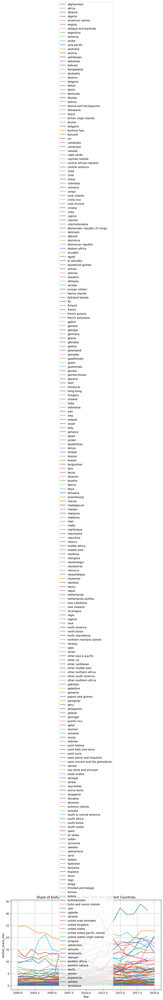

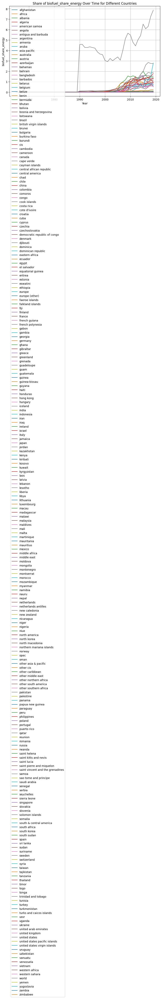

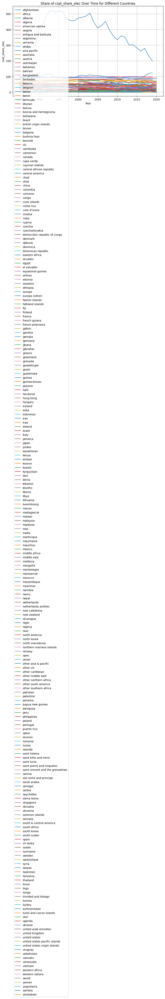

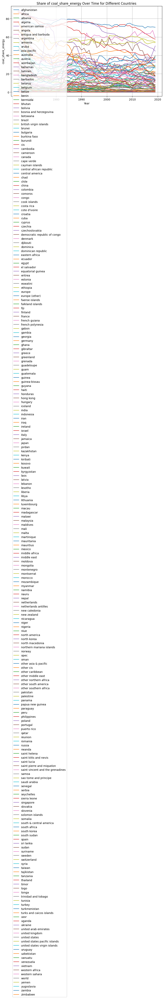

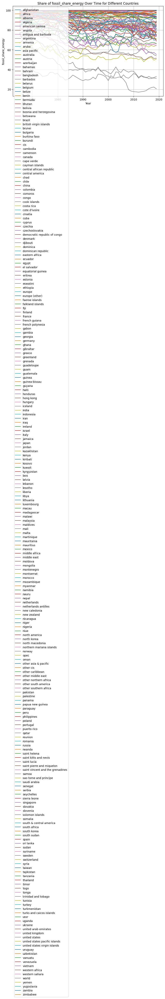

...

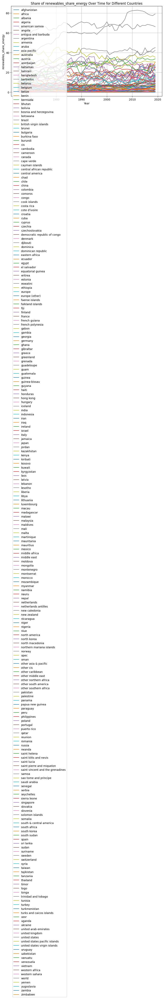

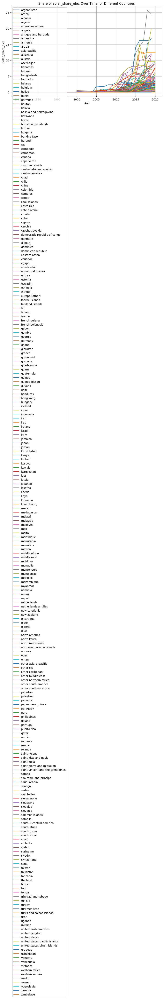

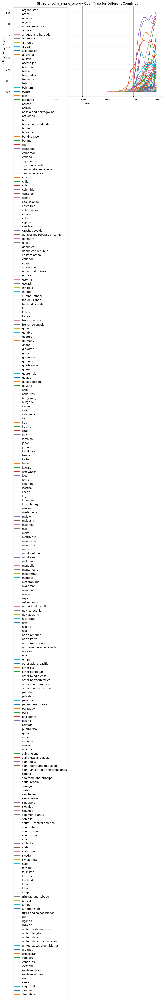

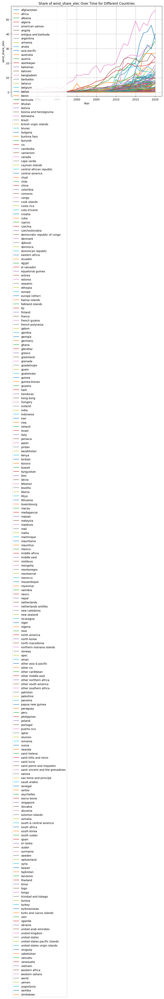

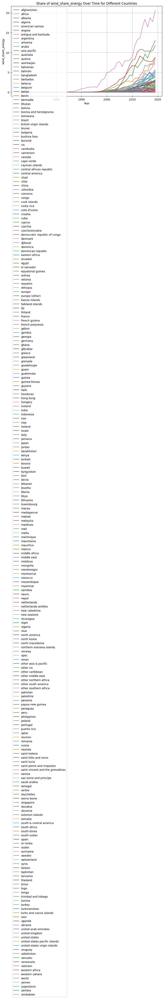

In [17]:
import matplotlib.pyplot as plt

# Create a plot for each column in columns_to_analyze
for col in columns_to_analyze:
    plt.figure(figsize=(10, 6))

    # Iterate over unique countries and plot data for each
    for country in df['country'].unique():
        country_data = df[df['country'] == country]
        plt.plot(country_data['year'], country_data[col], label=country.lower())

    plt.title(f'Share of {col} Over Time for Different Countries')
    plt.xlabel('Year')
    plt.ylabel(f'{col}')
    plt.grid(True)
    plt.legend()
    plt.show()



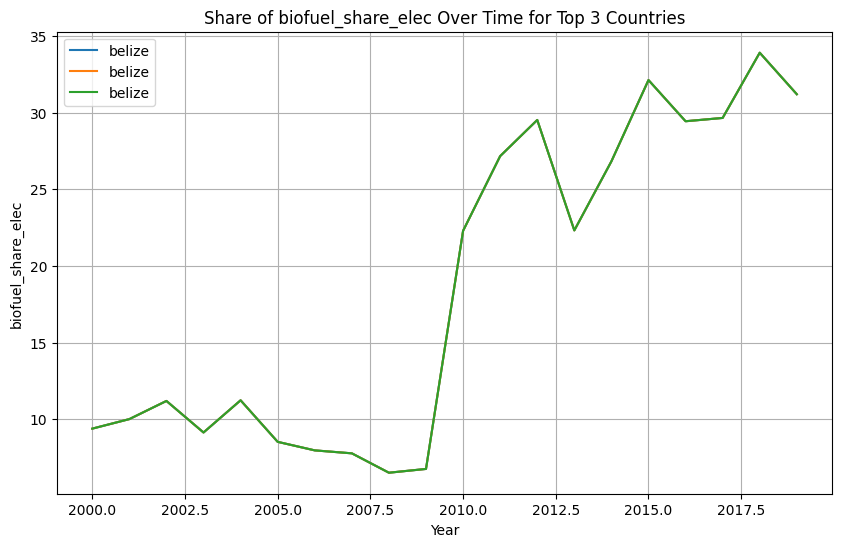

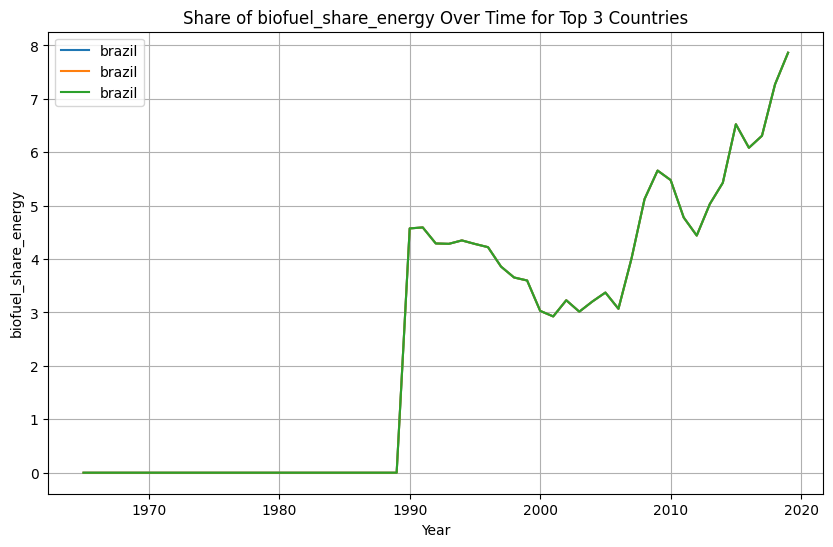

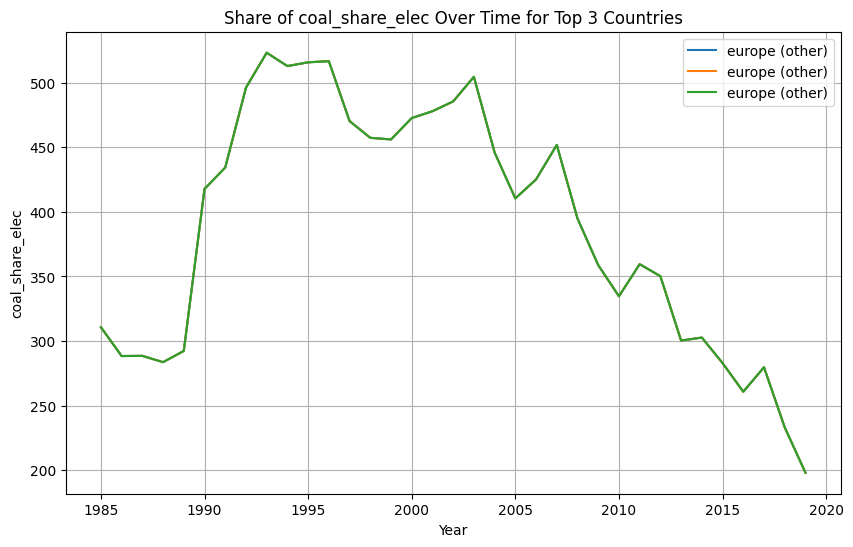

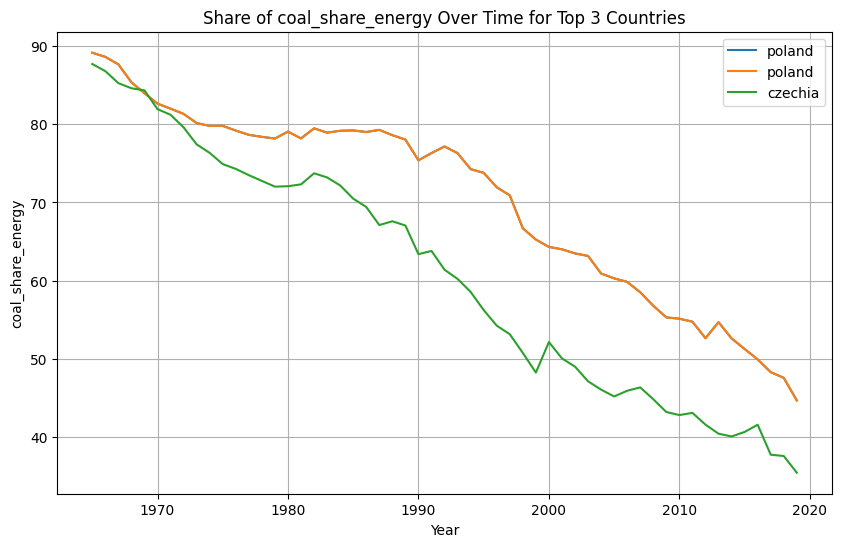

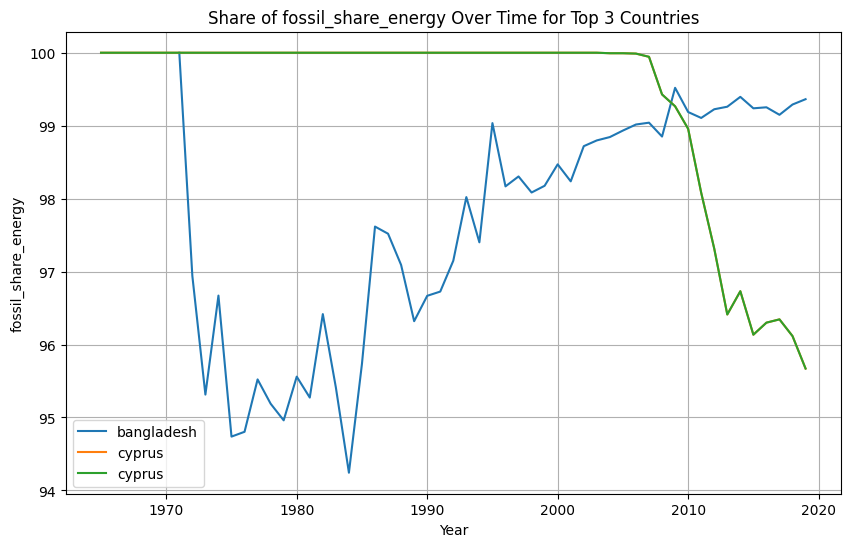

...

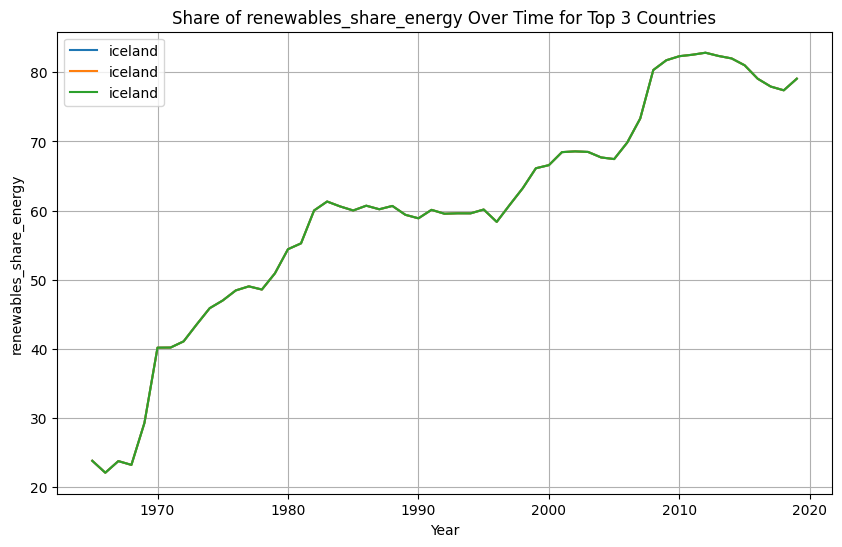

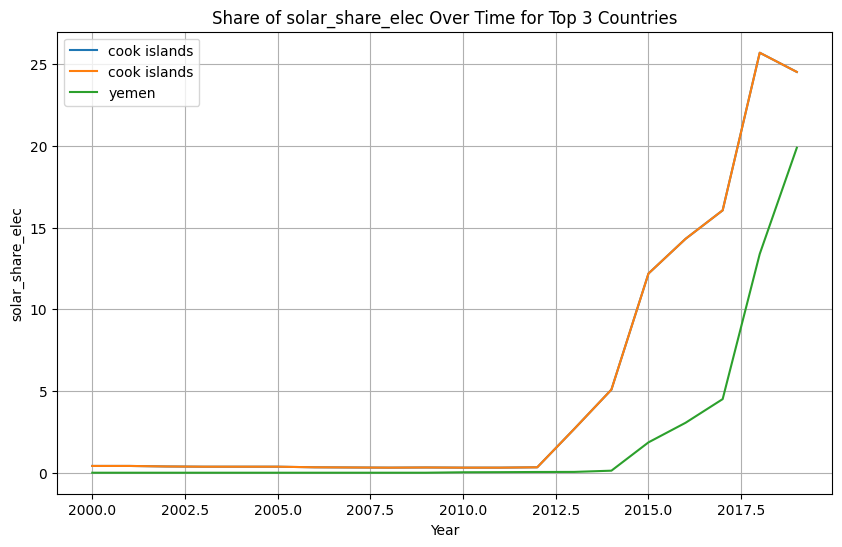

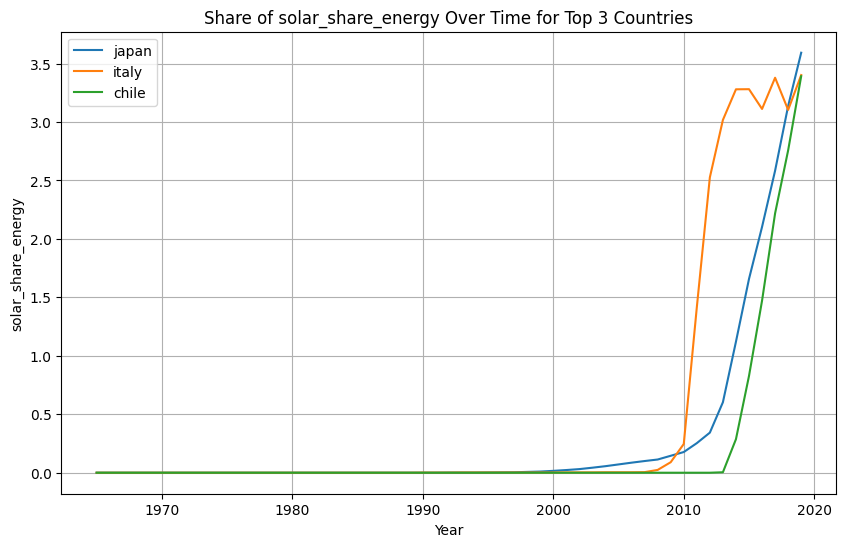

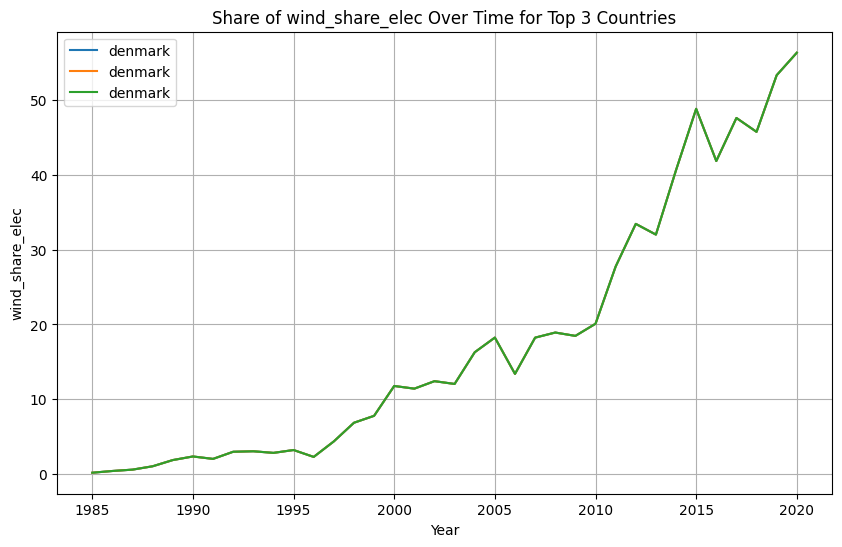

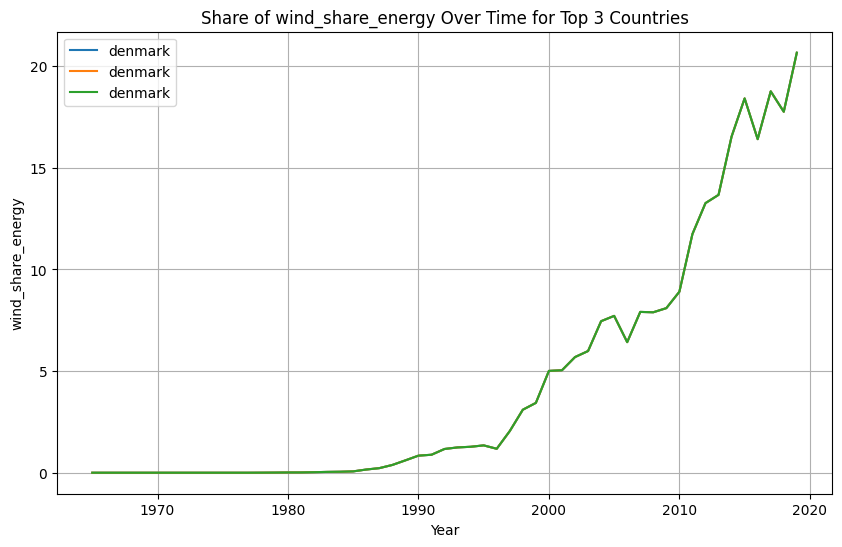

In [18]:
import matplotlib.pyplot as plt

# List to store the share attributes
share_attributes = []

# Create a plot for each column in columns_to_analyze
for col in columns_to_analyze:
    plt.figure(figsize=(10, 6))

    # Find the top 3 countries for the current share attribute
    top_countries = df.nlargest(3, col)['country']

    # Filter the data for only the top 3 countries
    filtered_data = df[df['country'].isin(top_countries)]

    # Iterate over the filtered data and plot data for each country
    for country in top_countries:
        country_data = filtered_data[filtered_data['country'] == country]
        plt.plot(country_data['year'], country_data[col], label=country.lower())

    plt.title(f'Share of {col} Over Time for Top 3 Countries')
    plt.xlabel('Year')
    plt.ylabel(f'{col}')
    plt.grid(True)
    plt.legend()
    plt.show()


In [19]:
# Create a dictionary to store the top 3 countries for each share attribute
top_countries_dict = {}

# Iterate over the columns to analyze
for col in columns_to_analyze:
    # Find the top 3 countries for the current share attribute
    top_countries = df.nlargest(3, col)[['country', col]]

    # Store the top countries in the dictionary
    top_countries_dict[col] = top_countries

# Display the top 3 countries for each share attribute
for col, top_countries in top_countries_dict.items():
    print(f"Top 3 countries for {col}:")
    print(top_countries)
    print("\n")


Top 3 countries for biofuel_share_elec:
     country  biofuel_share_elec
1722  Belize              33.912
1719  Belize              32.127
1723  Belize              31.203


Top 3 countries for biofuel_share_energy:
     country  biofuel_share_energy
2233  Brazil                 7.863
2232  Brazil                 7.270
2229  Brazil                 6.524


Top 3 countries for coal_share_elec:
             country  coal_share_elec
5428  Europe (other)          523.075
5431  Europe (other)          516.542
5430  Europe (other)          515.656


Top 3 countries for coal_share_energy:
       country  coal_share_energy
12769   Poland             89.158
12770   Poland             88.626
4152   Czechia             87.716


Top 3 countries for fossil_share_energy:
         country  fossil_share_energy
1432  Bangladesh                100.0
4096      Cyprus                100.0
4097      Cyprus                100.0


Top 3 countries for fossil_share_elec:
             country  fossil_share_elec
